<a href="https://colab.research.google.com/github/Dhanasree-Rajamani/DeepLearningProject/blob/main/Project/DL_Project_custom_trained.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Use a custom trained YOLOv7 model to perform grocery object detection

###Download YOLOv7 repository and install requirements

In [1]:
!git clone https://github.com/WongKinYiu/yolov7
%cd yolov7
!pip install -r requirements.txt

Cloning into 'yolov7'...
remote: Enumerating objects: 1157, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (10/10), done.
remote: Total 1157 (delta 10), reused 15 (delta 8), pack-reused 1139
Receiving objects: 100% (1157/1157), 70.42 MiB | 18.33 MiB/s, done.
Resolving deltas: 100% (496/496), done.
/content/yolov7
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 22.5 MB/s eta 0:00:00


###Using this dataset to train the model, commenting it out now, because we have saved the trained model weights now, which can be used further for the application. Need not run the training for the model every time, as it takes significant amount of time.

In [2]:
!unzip -q /content/groceries.zip -d ../ && rm /content/groceries.zip

###Training the model with our custom dataset

In [ ]:
!python train.py --img 640 --batch 16 --epochs 100 --data /content/data.yaml --weights yolov7x.pt --cache

2023-05-18 21:51:27.777031: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-18 21:51:28.639093: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
YOLOR 🚀 v0.1-122-g3b41c2c torch 2.0.1+cu118 CUDA:0 (Tesla T4, 15101.8125MB)

Namespace(weights='yolov7x.pt', cfg='', data='/content/data.yaml', hyp='data/hyp.scratch.p5.yaml', epochs=100, batch_size=16, img_size=[640, 640], rect=False, resume=False, nosave=False, notest=False, noautoanchor=False, evolve=False, bucket='', cache_images=True, image_weights=False, device='', multi_scale=False, single_cls=False, adam=False, sync_bn=False, local_rank=-1, workers=8, project='runs/train', entity=None, name='exp', exist_ok=False, quad=False, linear_lr=False, label_sm

###Use the custom weights to perform object detection on test images

In [3]:
!python detect.py --weights /content/best.pt --img 640 --conf 0.25 --source /content/test/images

Namespace(weights=['/content/best.pt'], source='/content/test/images', img_size=640, conf_thres=0.25, iou_thres=0.45, device='', view_img=False, save_txt=False, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', exist_ok=False, no_trace=False)
YOLOR 🚀 v0.1-122-g3b41c2c torch 2.0.1+cu118 CUDA:0 (Tesla T4, 15101.8125MB)

Fusing layers... 
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 354 layers, 71089684 parameters, 0 gradients, 189.0 GFLOPS
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

3 Cantaloupes, 6 Galias, 5 Honeydews, 1 Watermelon, Done. (36.6ms) Inference, (26.2ms) NMS
 The image with the r

In [5]:
from IPython.display import Image
import glob
from IPython.display import display

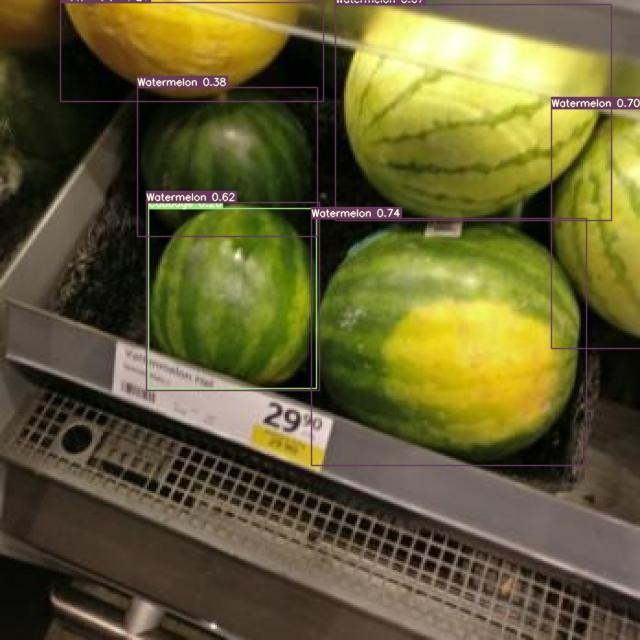

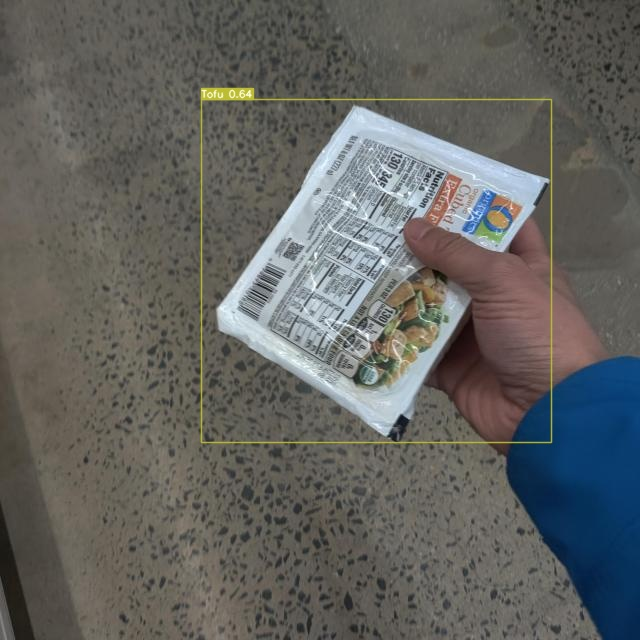

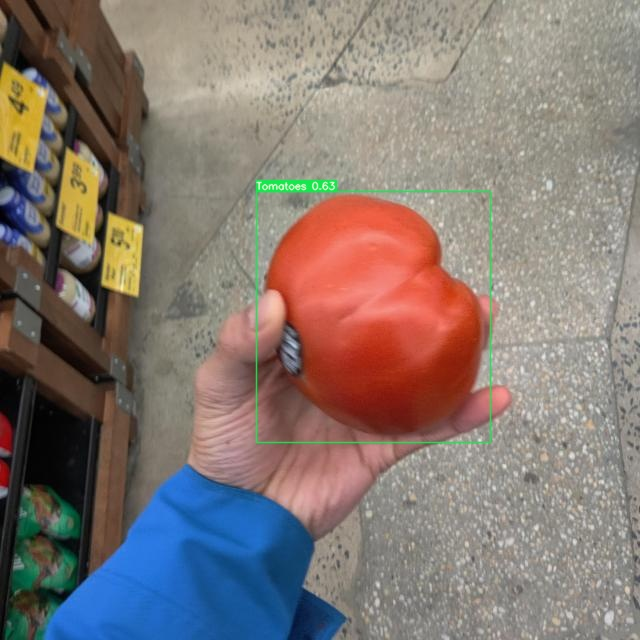

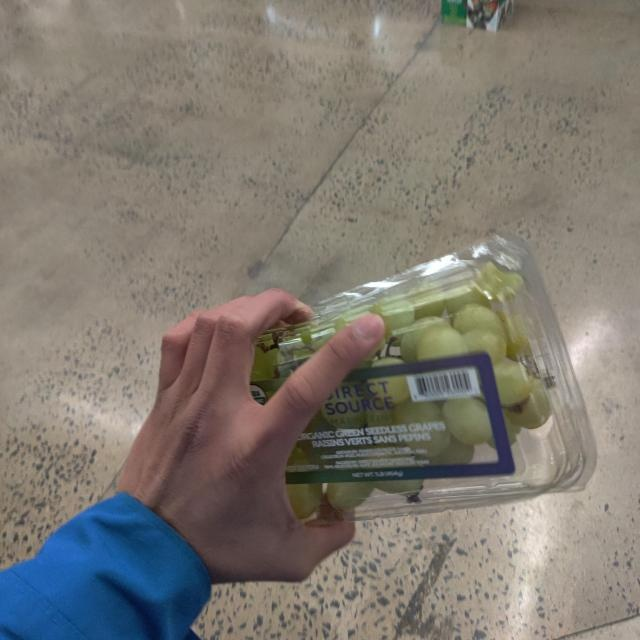

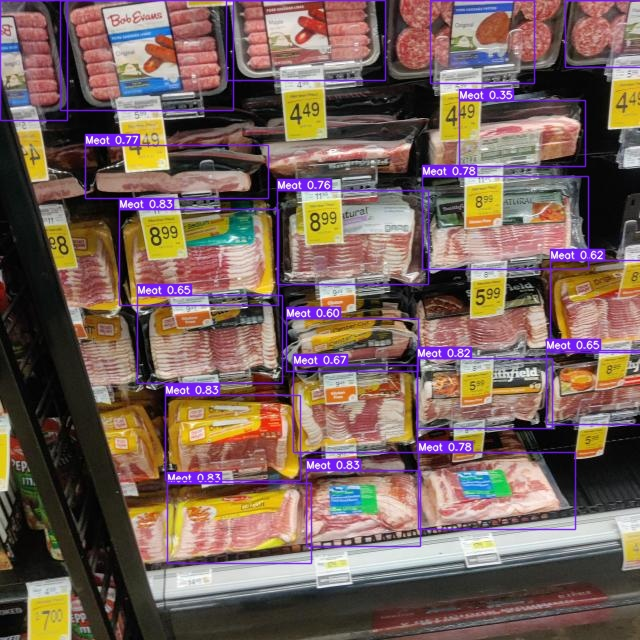

...

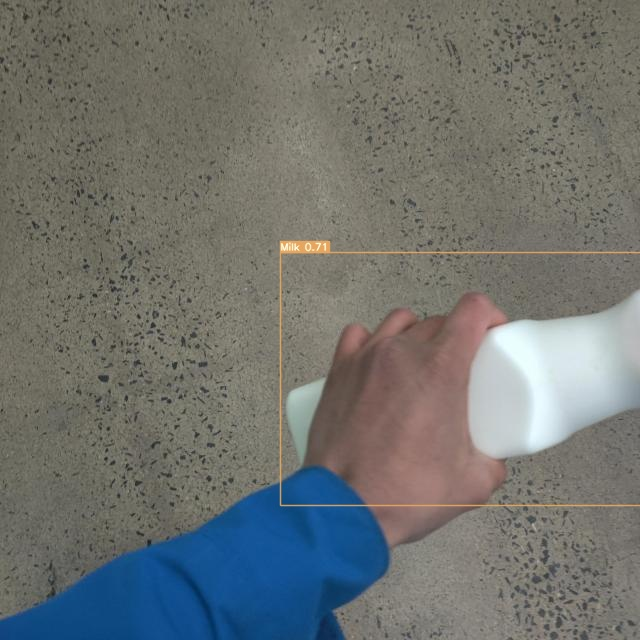

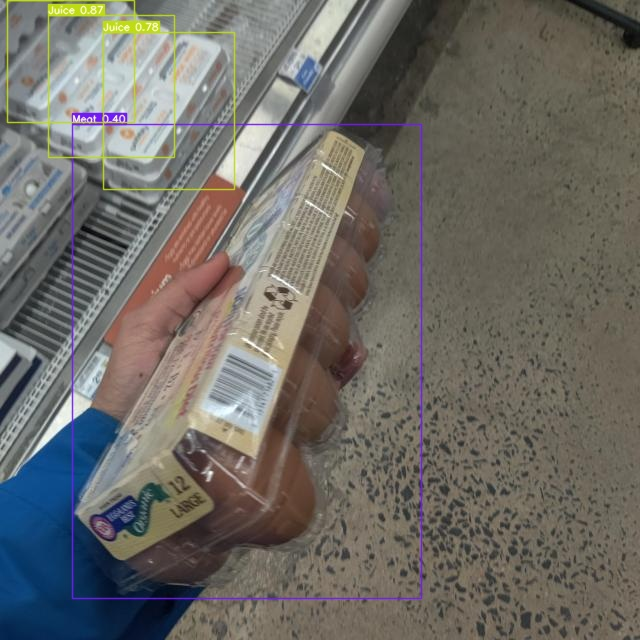

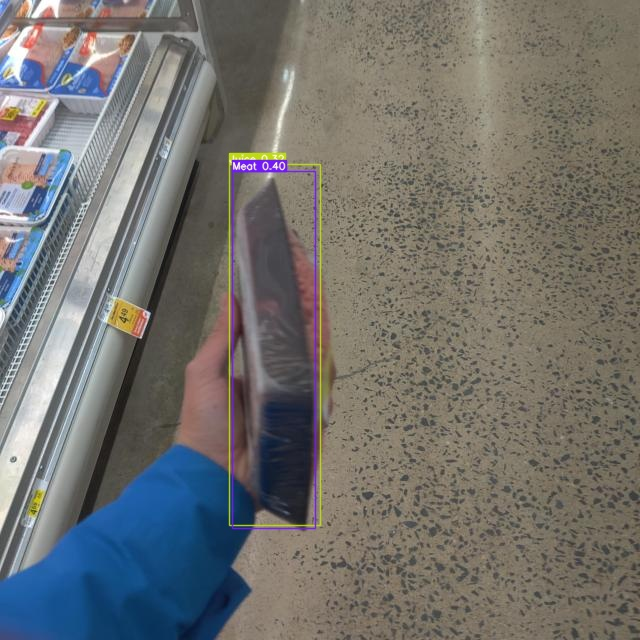

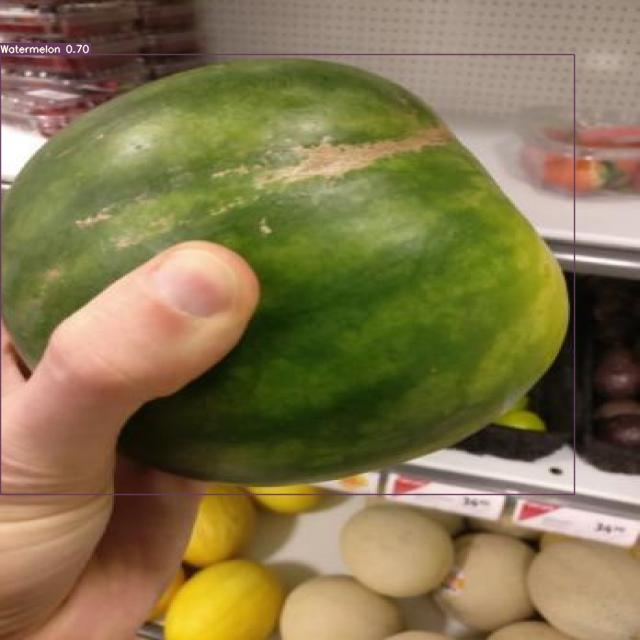

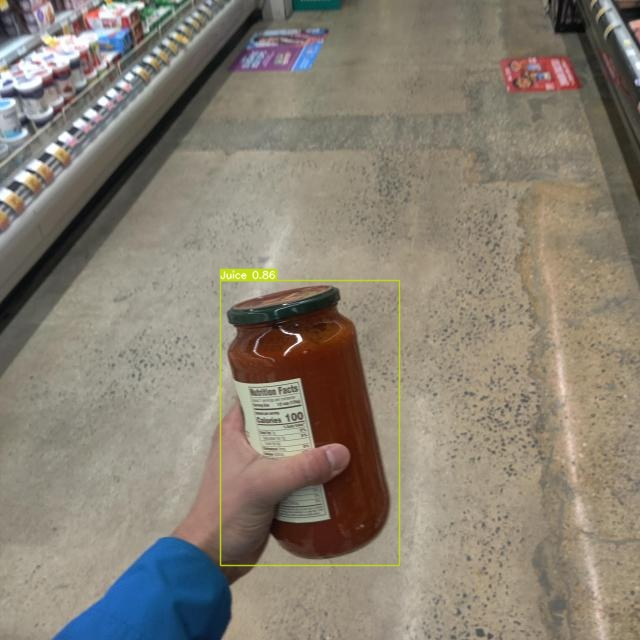

In [6]:
for imageName in glob.glob('/content/yolov7/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [4]:
!python detect.py --weights /content/best.pt --img 416 --conf 0.1 --source '/content/cheese.jpg'

Namespace(weights=['/content/best.pt'], source='/content/cheese.jpg', img_size=416, conf_thres=0.1, iou_thres=0.45, device='', view_img=False, save_txt=False, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', exist_ok=False, no_trace=False)
YOLOR 🚀 v0.1-122-g3b41c2c torch 2.0.1+cu118 CUDA:0 (Tesla T4, 15101.8125MB)

Fusing layers... 
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 354 layers, 71089684 parameters, 0 gradients, 189.0 GFLOPS
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

1 Butter, 4 Cheeses, Done. (16.5ms) Inference, (31.2ms) NMS
 The image with the result is saved in: runs/detect/ex

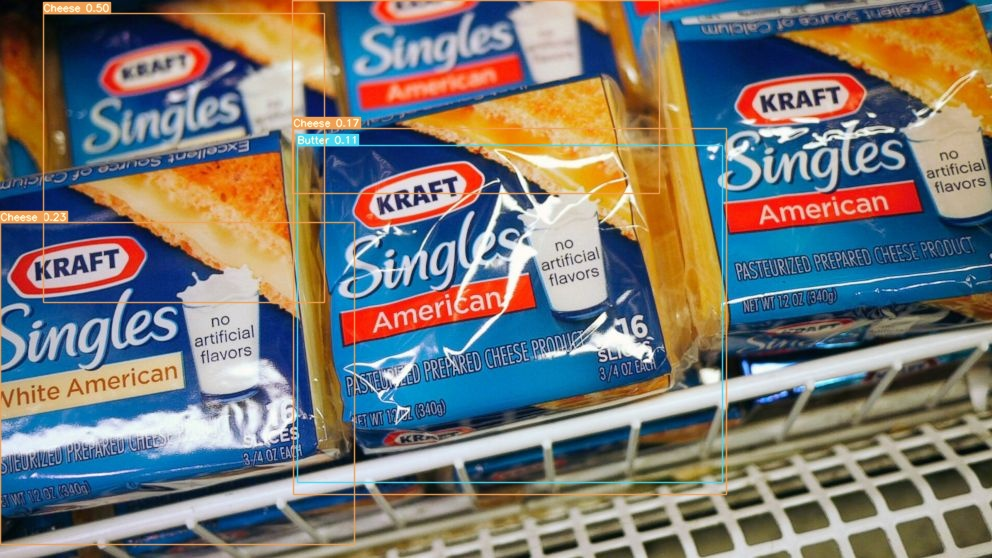

In [5]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov7/runs/detect/exp/cheese.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

###Gradio App

In [7]:
!pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [10]:
!pip install gradio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [11]:
import gradio as gr
import cv2
from PIL import ImageDraw, ImageFont
import numpy as np
from torchvision.transforms import functional as F
import torch
from PIL import Image

###Upload an image and detect the grocery objects!

In [12]:
import gradio as gr
import torch
from PIL import Image

# Load the YOLOv7 model
model = torch.hub.load('.', 'custom', '/content/best.pt', source='local')
model.eval()

def process_image(input_image, item_to_find):
    try:
        # Convert Gradio input image (numpy array) to PIL Image
        input_image = Image.fromarray(input_image.astype('uint8'), 'RGB')

        # Perform inference
        results = model(input_image)

        # Get the annotated image from the results
        annotated_image = results.render()[0]

        # Convert the annotated image to numpy array for Gradio
        annotated_image = annotated_image[:, :, ::-1]  # Convert RGB to BGR

        # Check if the item is present in the output labels
        labels = results.pandas().xyxy[0]["name"].tolist()
        if item_to_find in labels:
            message = "Yes! The item you are looking for is found."
        else:
            message = "Sorry! The item you are looking for is not found."

        return annotated_image, message

    except Exception as e:
        print(f"Error: {str(e)}")

def prompt_for_item():
    return gr.inputs.Textbox(label="Input the item you are looking for")

iface = gr.Interface(
    fn=process_image,
    inputs=["image", prompt_for_item()],
    outputs=["image", "text"],
    title="Know Your Grocery!! powered by YOLOv7",
    description="Upload an image and detect grocery objects using YOLOv7.",
    allow_flagging=False,
    theme="default",
    layout="vertical",
    server_port=7860
)

iface.launch()


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Adding autoShape... 


/usr/local/lib/python3.10/dist-packages/gradio/inputs.py:27: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/gradio/inputs.py:30: UserWarning: `optional` parameter is deprecated, and it has no effect
  super().__init__(
/usr/local/lib/python3.10/dist-packages/gradio/inputs.py:30: UserWarning: `numeric` parameter is deprecated, and it has no effect
  super().__init__(
<ipython-input-12-3c8262f68544>:38: UserWarning: `layout` parameter is deprecated, and it has no effect
  iface = gr.Interface(
<ipython-input-12-3c8262f68544>:38: UserWarning: `server_port` is deprecated in `Interface()`, please use it within `launch()` instead.
  iface = gr.Interface(
/usr/local/lib/python3.10/dist-packages/gradio/interface.py:323: UserWarning: The `allow_flagging` parameter in `Interface` nowtakes a string value ('auto', 'manual', or 'never'), not a boo

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>

###Click an image using camera and detect the grocery objects

In [13]:
import torch
from PIL import Image, ImageDraw
import gradio as gr

# Load the YOLOv7 model
model = torch.hub.load('.', 'custom', '/content/best.pt', source='local')
model.eval()


def process_image(input_image, item):
    try:
        # Convert Gradio input image (numpy array) to PIL Image
        input_image = Image.fromarray(input_image.astype('uint8'), 'RGB')

        # Perform inference
        results = model(input_image)

        # Check if the item is found in the detected objects
        detected_objects = results.pandas().xyxy[0]
        if item in detected_objects["name"].values:
            result = "Yes! the Item you are looking for is found"
        else:
            result = "No! the Item you are looking for is not found"

        # Get the annotated image from the results
        annotated_image = results.render()[0]

        # Convert the annotated image to numpy array for Gradio
        annotated_image = annotated_image[:, :, ::-1]  # Convert RGB to BGR
        return annotated_image, result

    except Exception as e:
        print(f"Error: {str(e)}")


iface = gr.Interface(
    fn=process_image,
    inputs=[
        gr.inputs.Image(source="webcam", tool="opencv", type="numpy"),
        gr.inputs.Textbox(label="Enter the item you are looking for")
    ],
    outputs=["image", "text"],
    title="Know Your Grocery!! powered by YOLOv7",
    description="Click a photo and detect grocery products in the image using YOLOv7.",
    allow_flagging=False,
    theme="default",
    layout="vertical",
    server_port=7860
)

iface.launch(inbrowser=True)


Adding autoShape... 


/usr/local/lib/python3.10/dist-packages/gradio/inputs.py:259: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/gradio/inputs.py:262: UserWarning: `optional` parameter is deprecated, and it has no effect
  super().__init__(
/usr/local/lib/python3.10/dist-packages/gradio/inputs.py:27: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/gradio/inputs.py:30: UserWarning: `optional` parameter is deprecated, and it has no effect
  super().__init__(
/usr/local/lib/python3.10/dist-packages/gradio/inputs.py:30: UserWarning: `numeric` parameter is deprecated, and it has no effect
  super().__init__(
<ipython-input-13-0c09e01af4a1>:36: UserWarning: `layout` parameter is deprecated, and it has no effec

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>

In [ ]:
# # Load the YOLO model
# model = torch.hub.load('WongKinYiu/yolov7', 'yolov7', force_reload=True)

# def process_image(input_image):
#     try:
#         # Convert Gradio input image (numpy array) to PIL Image
#         input_image = Image.fromarray(input_image.astype('uint8'), 'RGB')
        
#         # Perform inference
#         results = model(input_image)
        
#         # Get the annotated image from the results
#         annotated_image = results.render()[0]
        
#         # Convert the annotated image to numpy array for Gradio
#         annotated_image = annotated_image[:, :, ::-1]  # Convert RGB to BGR
#         return annotated_image

#     except Exception as e:
#         print(f"Error: {str(e)}")

# iface = gr.Interface(
#     fn=process_image,
#     inputs=gr.inputs.Image(source="webcam", tool="opencv", type="numpy"),
#     outputs="image",
#     title="Know Your Grocery!! powered by YOLOv7",
#     description="Click a photo and Detect grocery products in the image using YOLOv7.",
#     allow_flagging=False,
#     theme="default",
#     layout="vertical",
#     server_port=7860
# )

# iface.launch(inbrowser=True)


Downloading: "https://github.com/WongKinYiu/yolov7/zipball/main" to /root/.cache/torch/hub/main.zip


Adding autoShape... 


/usr/local/lib/python3.10/dist-packages/gradio/inputs.py:259: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/gradio/deprecation.py:40: UserWarning: `optional` parameter is deprecated, and it has no effect
  warnings.warn(value)


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>